In [131]:
# Importing libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import seaborn as sns
from sklearn.preprocessing import LabelEncoder, StandardScaler

from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC

from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, auc
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV

from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn import linear_model
import warnings
warnings.filterwarnings('ignore')


In [132]:
# '?' is the unwanted value, which we will consider as NaN value
missing_val = '?'

In [133]:
# Reading the data from csv file, to check the fraud detection in the dataset
ds = pd.read_csv('Insurance_Fraud.csv', na_values=missing_val)
ds

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,NaN,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,NaN,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,NaN,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN


In [134]:
# Checking the initial shape of the dataset as how many rows and columns are present in it
ds.shape

(1000, 40)

In [135]:
# Removing the duplicate rows from the dataset

print ('Shape of dataset before removing duplicates: ', ds.shape)
# Dropping the duplicate rows
ds = ds.drop_duplicates(keep='first')
print ('Shape of dataset after removing duplicates: ', ds.shape)

Shape of dataset before removing duplicates:  (1000, 40)
Shape of dataset after removing duplicates:  (1000, 40)


In [136]:
# Checking the columns of the dataset as on which features, 'fraud_reported' is dependent
ds.columns

Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported', '_c39'],
      dtype='object')

In [137]:
# Checking the datatypes of the columns
ds.dtypes

months_as_customer               int64
age                              int64
policy_number                    int64
policy_bind_date                object
policy_state                    object
policy_csl                      object
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_zip                      int64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_date                   object
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_location               object
incident_hour_of_the_day 

In [138]:
# Checking the columns information
ds.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

# Summarize the 'fraud_reported' distribution

In [139]:
ds.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,NaN,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN


In [140]:
from collections import Counter

target = ds.values[:,-2]
counter = Counter(target)

for k, v in counter.items():
    per = v/len(target) * 100
    print ('fraud_reported = %s, Count=%d, Percentage=%.3f%%' %(k, v, per) )

fraud_reported = Y, Count=247, Percentage=24.700%
fraud_reported = N, Count=753, Percentage=75.300%


In [141]:
# identifying the number columns
ds_int = ds.select_dtypes(include=['int64', 'int32', 'float'])
ds_int.columns

Index(['months_as_customer', 'age', 'policy_number', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip',
       'capital-gains', 'capital-loss', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'bodily_injuries', 'witnesses',
       'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim',
       'auto_year', '_c39'],
      dtype='object')

In [142]:
# identifying the category columns
ds_cat = ds.select_dtypes(include=['object'])
ds_cat.columns

Index(['policy_bind_date', 'policy_state', 'policy_csl', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'incident_date', 'incident_type',
       'collision_type', 'incident_severity', 'authorities_contacted',
       'incident_state', 'incident_city', 'incident_location',
       'property_damage', 'police_report_available', 'auto_make', 'auto_model',
       'fraud_reported'],
      dtype='object')

# Statistical Summary

In [143]:
ds.describe()

,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year,_c39
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000,0.0
mean,203.954000,38.948000,546238.648000,1136.000000,1256.406150,1.101000e+06,501214.488000,25126.100000,-26793.700000,11.644000,1.83900,0.992000,1.487000,52761.94000,7433.420000,7399.570000,37928.950000,2005.103000,NaN
std,115.113174,9.140287,257063.005276,611.864673,244.167395,2.297407e+06,71701.610941,27872.187708,28104.096686,6.951373,1.01888,0.820127,1.111335,26401.53319,4880.951853,4824.726179,18886.252893,6.015861,NaN
min,0.000000,19.000000,100804.000000,500.000000,433.330000,-1.000000e+06,430104.000000,0.000000,-111100.000000,0.000000,1.00000,0.000000,0.000000,100.00000,0.000000,0.000000,70.000000,1995.000000,NaN
25%,115.750000,32.000000,335980.250000,500.000000,1089.607500,0.000000e+00,448404.500000,0.000000,-51500.000000,6.000000,1.00000,0.000000,1.000000,41812.50000,4295.000000,4445.000000,30292.500000,2000.000000,NaN
50%,199.500000,38.000000,533135.000000,1000.000000,1257.200000,0.000000e+00,466445.500000,0.000000,-23250.000000,12.000000,1.00000,1.000000,1.000000,58055.00000,6775.000000,6750.000000,42100.000000,2005.000000,NaN
75%,276.250000,44.000000,759099.750000,2000.000000,1415.695000,0.000000e+00,603251.000000,51025.000000,0.000000,17.000000,3.00000,2.000000,2.000000,70592.50000,11305.000000,10885.000000,50822.500000,2010.000000,NaN
max,479.000000,64.000000,999435.000000,2000.000000,2047.590000,1.000000e+07,620962.000000,100500.000000,0.000000,23.000000,4.00000,2.000000,3.000000,114920.00000,21450.000000,23670.000000,79560.000000,2015.000000,NaN


From above analysis, it seems outliers are present in the dataset

In [144]:
# Checking for null values
ds.isnull().sum()

months_as_customer                0
age                               0
policy_number                     0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                  178
incident_severity                 0
authorities_contacted             0
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage             

In [145]:
# All values are NaN for this column, so dropping the column
ds.drop(columns=['_c39'], inplace=True)

In [146]:
ds.isna().sum()

months_as_customer               0
age                              0
policy_number                    0
policy_bind_date                 0
policy_state                     0
policy_csl                       0
policy_deductable                0
policy_annual_premium            0
umbrella_limit                   0
insured_zip                      0
insured_sex                      0
insured_education_level          0
insured_occupation               0
insured_hobbies                  0
insured_relationship             0
capital-gains                    0
capital-loss                     0
incident_date                    0
incident_type                    0
collision_type                 178
incident_severity                0
authorities_contacted            0
incident_state                   0
incident_city                    0
incident_location                0
incident_hour_of_the_day         0
number_of_vehicles_involved      0
property_damage                360
bodily_injuries     

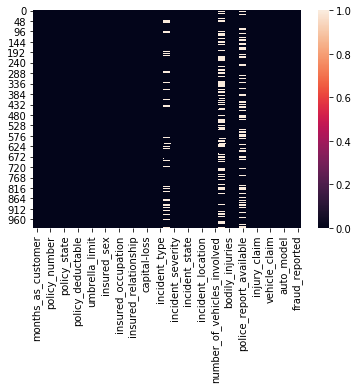

In [147]:
# Null values check through heatmap visualization
sns.heatmap(ds.isnull())

In [148]:
ds.columns

Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported'],
      dtype='object')

In [149]:
ds.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,0,NaN,5070,780,780,3510,Mercedes,E400,2007,Y
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,1,NO,6500,1300,650,4550,Accura,RSX,2009,N


In [150]:
# Replacing NaN values with 0
ds.replace(np.nan, 0, inplace=True)

In [151]:
ds.isnull().sum()

months_as_customer             0
age                            0
policy_number                  0
policy_bind_date               0
policy_state                   0
policy_csl                     0
policy_deductable              0
policy_annual_premium          0
umbrella_limit                 0
insured_zip                    0
insured_sex                    0
insured_education_level        0
insured_occupation             0
insured_hobbies                0
insured_relationship           0
capital-gains                  0
capital-loss                   0
incident_date                  0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_state                 0
incident_city                  0
incident_location              0
incident_hour_of_the_day       0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_rep

In [152]:
ds.shape

(1000, 39)

# Checking the unique values of columns of dataset

In [153]:
ds['policy_deductable'].unique()

array([1000, 2000,  500], dtype=int64)

In [154]:
ds['umbrella_limit'].unique()

array([       0,  5000000,  6000000,  4000000,  3000000,  8000000,
        7000000,  9000000, 10000000, -1000000,  2000000], dtype=int64)

In [155]:
ds['incident_hour_of_the_day'].unique()

array([ 5,  8,  7, 20, 19,  0, 23, 21, 14, 22,  9, 12, 15,  6, 16,  4, 10,
        1, 17,  3, 11, 13, 18,  2], dtype=int64)

In [156]:
ds['number_of_vehicles_involved'].unique()

array([1, 3, 4, 2], dtype=int64)

In [157]:
ds['bodily_injuries'].unique()

array([1, 0, 2], dtype=int64)

In [158]:
ds['witnesses'].unique()

array([2, 0, 3, 1], dtype=int64)

In [159]:
ds['auto_year'].unique()

array([2004, 2007, 2014, 2009, 2003, 2012, 2015, 1996, 2002, 2006, 2000,
       2010, 1999, 2011, 2005, 2008, 1995, 2001, 1998, 1997, 2013],
      dtype=int64)

In [160]:
ds['policy_state'].unique()

array(['OH', 'IN', 'IL'], dtype=object)

In [161]:
ds['policy_csl'].unique()

array(['250/500', '100/300', '500/1000'], dtype=object)

In [162]:
ds['insured_sex'].unique()

array(['MALE', 'FEMALE'], dtype=object)

In [163]:
ds['insured_education_level'].unique()

array(['MD', 'PhD', 'Associate', 'Masters', 'High School', 'College',
       'JD'], dtype=object)

In [164]:
ds['insured_occupation'].unique()

array(['craft-repair', 'machine-op-inspct', 'sales', 'armed-forces',
       'tech-support', 'prof-specialty', 'other-service',
       'priv-house-serv', 'exec-managerial', 'protective-serv',
       'transport-moving', 'handlers-cleaners', 'adm-clerical',
       'farming-fishing'], dtype=object)

In [165]:
ds['insured_hobbies'].unique()

array(['sleeping', 'reading', 'board-games', 'bungie-jumping',
       'base-jumping', 'golf', 'camping', 'dancing', 'skydiving',
       'movies', 'hiking', 'yachting', 'paintball', 'chess', 'kayaking',
       'polo', 'basketball', 'video-games', 'cross-fit', 'exercise'],
      dtype=object)

In [166]:
ds['insured_relationship'].unique()

array(['husband', 'other-relative', 'own-child', 'unmarried', 'wife',
       'not-in-family'], dtype=object)

In [167]:
ds['incident_type'].unique()

array(['Single Vehicle Collision', 'Vehicle Theft',
       'Multi-vehicle Collision', 'Parked Car'], dtype=object)

In [168]:
ds['collision_type'].unique()

array(['Side Collision', 0, 'Rear Collision', 'Front Collision'],
      dtype=object)

In [169]:
ds['incident_severity'].unique()

array(['Major Damage', 'Minor Damage', 'Total Loss', 'Trivial Damage'],
      dtype=object)

In [170]:
ds['authorities_contacted'].unique()

array(['Police', 'None', 'Fire', 'Other', 'Ambulance'], dtype=object)

In [171]:
ds['incident_state'].unique()

array(['SC', 'VA', 'NY', 'OH', 'WV', 'NC', 'PA'], dtype=object)

In [172]:
ds['incident_city'].unique()

array(['Columbus', 'Riverwood', 'Arlington', 'Springfield', 'Hillsdale',
       'Northbend', 'Northbrook'], dtype=object)

In [173]:
ds['incident_city'].unique()

array(['Columbus', 'Riverwood', 'Arlington', 'Springfield', 'Hillsdale',
       'Northbend', 'Northbrook'], dtype=object)

# 'fraud_reported' based on some features

In [174]:
ds.groupby(['policy_deductable'])['fraud_reported'].count()

policy_deductable
500     342
1000    351
2000    307
Name: fraud_reported, dtype: int64

In [175]:
ds.groupby(['number_of_vehicles_involved'])['fraud_reported'].count()

number_of_vehicles_involved
1    581
2     30
3    358
4     31
Name: fraud_reported, dtype: int64

In [176]:
ds.groupby(['insured_sex'])['fraud_reported'].count()

insured_sex
FEMALE    537
MALE      463
Name: fraud_reported, dtype: int64

In [177]:
ds.groupby(['incident_severity'])['fraud_reported'].count()

incident_severity
Major Damage      276
Minor Damage      354
Total Loss        280
Trivial Damage     90
Name: fraud_reported, dtype: int64

In [178]:
ds.groupby(['incident_city'])['fraud_reported'].count()

incident_city
Arlington      152
Columbus       149
Hillsdale      141
Northbend      145
Northbrook     122
Riverwood      134
Springfield    157
Name: fraud_reported, dtype: int64

In [179]:
ds.groupby(['police_report_available'])['fraud_reported'].count()

police_report_available
0      343
NO     343
YES    314
Name: fraud_reported, dtype: int64

# Checking the corelation

In [180]:
ds.corr()

,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year
months_as_customer,1.000000,0.922098,0.057555,0.026807,0.005018,0.015498,0.017895,0.006399,0.020209,0.070639,0.014736,-0.010162,0.058383,0.062108,0.065329,0.034940,0.061013,-0.000292
age,0.922098,1.000000,0.059413,0.029188,0.014404,0.018126,0.025604,-0.007075,0.007368,0.087161,0.022102,-0.015679,0.052359,0.069863,0.075522,0.060898,0.062588,0.001354
policy_number,0.057555,0.059413,1.000000,-0.006738,0.022566,0.008968,0.007083,0.009802,-0.005669,0.000113,0.013432,-0.004558,-0.012661,-0.018009,-0.008762,-0.010678,-0.020184,-0.000183
policy_deductable,0.026807,0.029188,-0.006738,1.000000,-0.003245,0.010870,0.004545,0.035212,-0.023544,0.060935,0.051214,-0.022765,0.066639,0.022839,0.039107,0.064792,0.005269,0.026105
policy_annual_premium,0.005018,0.014404,0.022566,-0.003245,1.000000,-0.006247,0.032354,-0.013738,0.023547,-0.001578,-0.045991,0.026780,0.002332,0.009094,-0.017633,-0.011654,0.020246,-0.049226
umbrella_limit,0.015498,0.018126,0.008968,0.010870,-0.006247,1.000000,0.019671,-0.047268,-0.024056,-0.023257,-0.021270,0.022743,-0.006738,-0.040344,-0.045412,-0.023790,-0.038584,0.009893
insured_zip,0.017895,0.025604,0.007083,0.004545,0.032354,0.019671,1.000000,0.006303,0.049372,0.008274,0.027448,0.028695,0.019805,-0.033873,-0.017495,-0.006841,-0.041083,-0.032736
capital-gains,0.006399,-0.007075,0.009802,0.035212,-0.013738,-0.047268,0.006303,1.000000,-0.046904,-0.016406,0.061643,0.055829,-0.017651,0.015980,0.025934,-0.000779,0.015836,0.031398
capital-loss,0.020209,0.007368,-0.005669,-0.023544,0.023547,-0.024056,0.049372,-0.046904,1.000000,-0.025054,-0.014895,-0.024418,-0.041330,-0.036060,-0.046060,-0.022863,-0.032665,-0.056615
incident_hour_of_the_day,0.070639,0.087161,0.000113,0.060935,-0.001578,-0.023257,0.008274,-0.016406,-0.025054,1.000000,0.120794,-0.034563,0.006527,0.217702,0.165768,0.179536,0.215626,0.021368


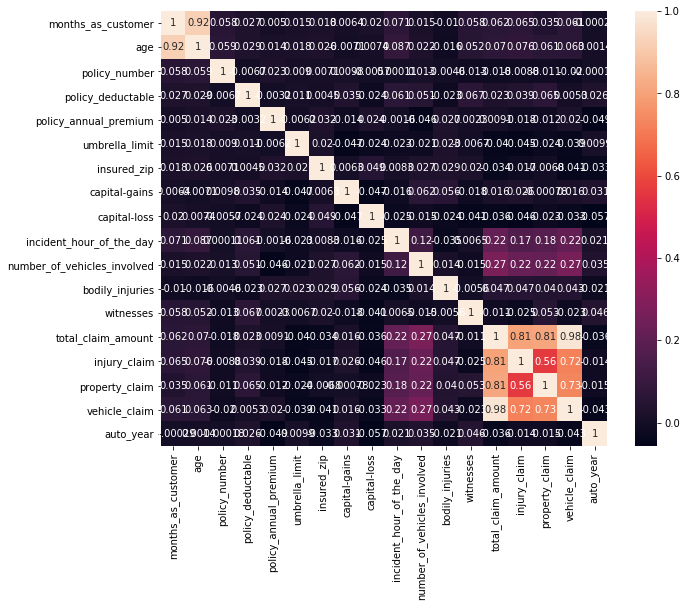

In [181]:
# Corelation through heatmap
plt.figure(figsize=(10,8))
sns.heatmap(ds.corr(), annot=True)

Very less corelation is there in the datset

# Countplot for features

# Univariate Analysis

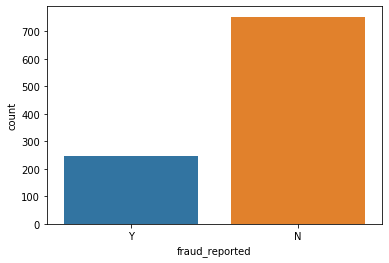

In [182]:
sns.countplot(ds['fraud_reported'])


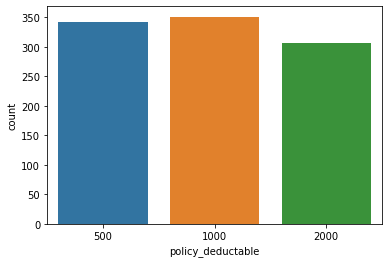

In [183]:
sns.countplot(ds['policy_deductable'])

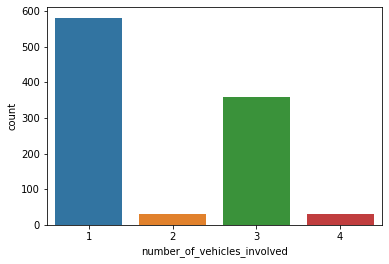

In [184]:
sns.countplot(ds['number_of_vehicles_involved'])

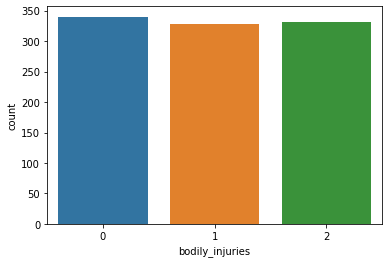

In [185]:
sns.countplot(ds['bodily_injuries'])

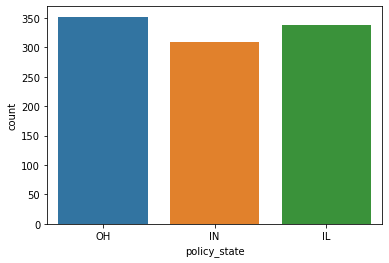

In [186]:
sns.countplot(ds['policy_state'])

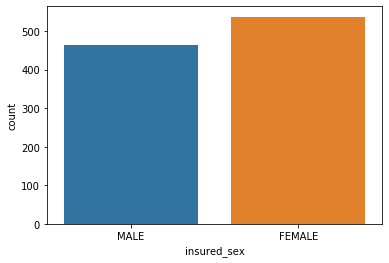

In [187]:
sns.countplot(ds['insured_sex'])

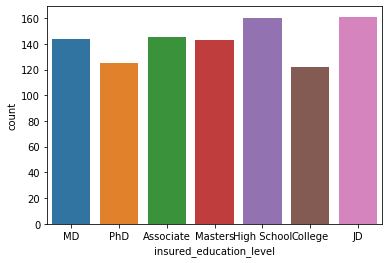

In [188]:
sns.countplot(ds['insured_education_level'])

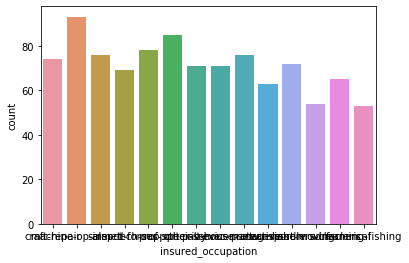

In [189]:
sns.countplot(ds['insured_occupation'])

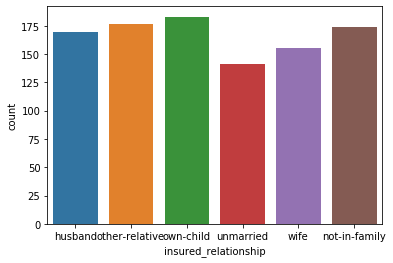

In [190]:
sns.countplot(ds['insured_relationship'])

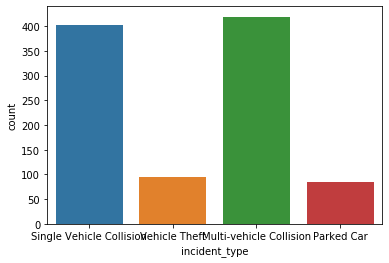

In [191]:
sns.countplot(ds['incident_type'])

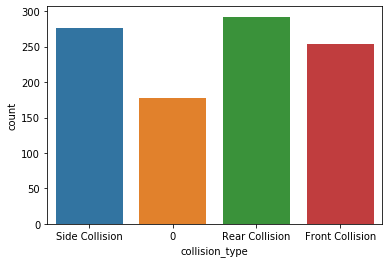

In [192]:
sns.countplot(ds['collision_type'])

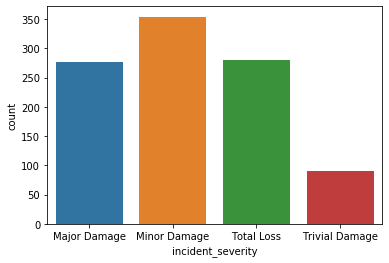

In [193]:
sns.countplot(ds['incident_severity'])

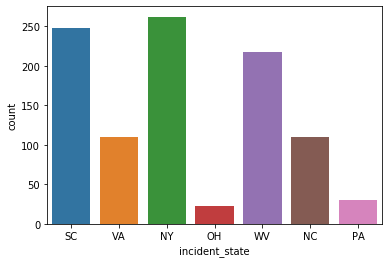

In [194]:
sns.countplot(ds['incident_state'])

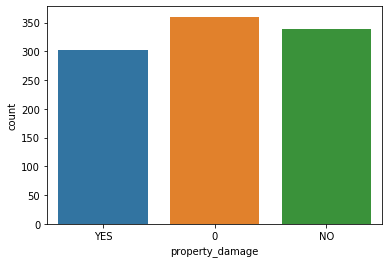

In [195]:
sns.countplot(ds['property_damage'])

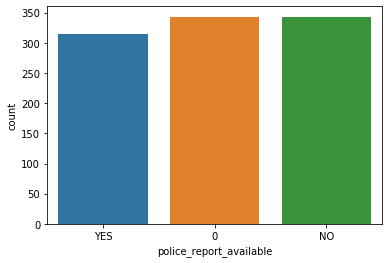

In [196]:
sns.countplot(ds['police_report_available'])

# Histograms: A frequency distribution shows how often each different value in a set of data occurs.

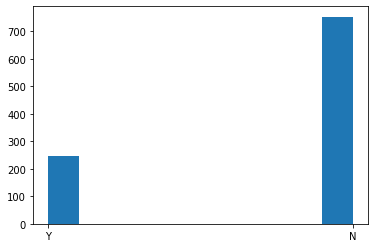

In [197]:
plt.hist(ds['fraud_reported'])
plt.show()

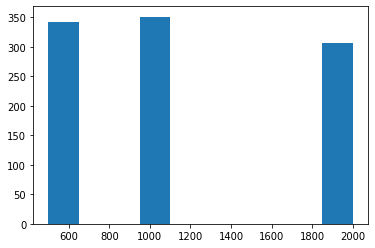

In [198]:
plt.hist(ds['policy_deductable'])
plt.show()

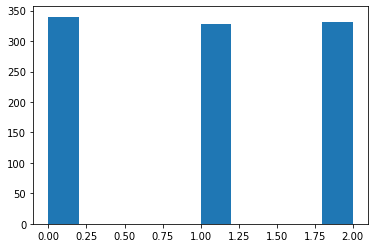

In [199]:
plt.hist(ds['bodily_injuries'])
plt.show()

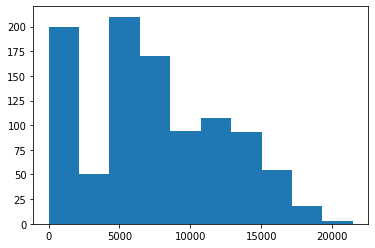

In [200]:
plt.hist(ds['injury_claim'])
plt.show()

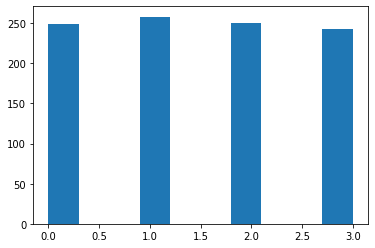

In [201]:
plt.hist(ds['witnesses'])
plt.show()

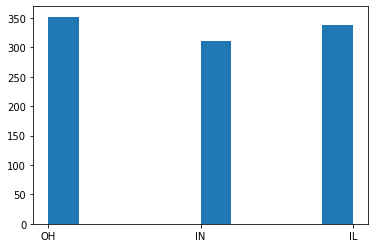

In [202]:
plt.hist(ds['policy_state'])
plt.show()

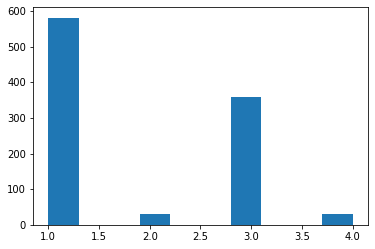

In [203]:
plt.hist(ds['number_of_vehicles_involved'])
plt.show()

In [204]:
# LabelEncoder is used to convert category data to number data
le = LabelEncoder()

for i in ds_cat:
    ds[i] = le.fit_transform(ds[i].astype(str))

In [205]:
ds.dtypes

months_as_customer               int64
age                              int64
policy_number                    int64
policy_bind_date                 int32
policy_state                     int32
policy_csl                       int32
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_zip                      int64
insured_sex                      int32
insured_education_level          int32
insured_occupation               int32
insured_hobbies                  int32
insured_relationship             int32
capital-gains                    int64
capital-loss                     int64
incident_date                    int32
incident_type                    int32
collision_type                   int32
incident_severity                int32
authorities_contacted            int32
incident_state                   int32
incident_city                    int32
incident_location                int32
incident_hour_of_the_day 

# Violinplot:

A violin plot is a method of plotting numeric data. It is similar to a box plot, with the addition of a 
rotated kernel density plot on each side.

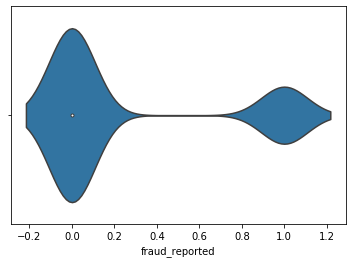

In [206]:
sns.violinplot(ds['fraud_reported'])

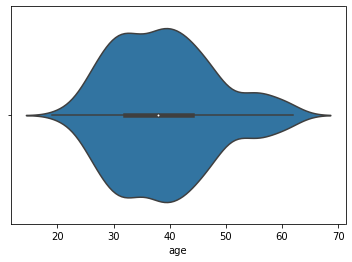

In [207]:
sns.violinplot(ds['age'])

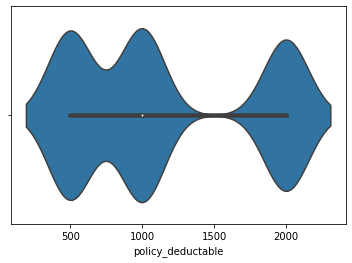

In [208]:
sns.violinplot(ds['policy_deductable'])

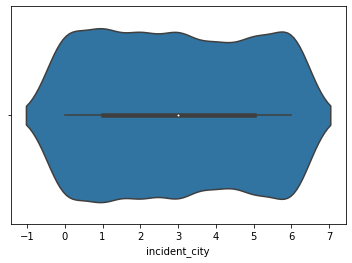

In [209]:
sns.violinplot(ds['incident_city'])

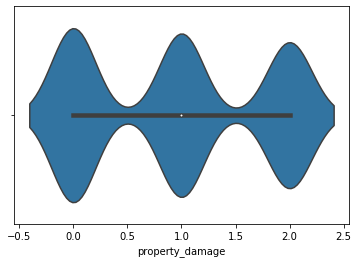

In [210]:
sns.violinplot(ds['property_damage'])

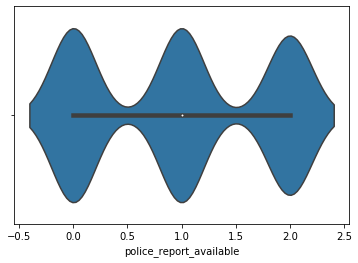

In [211]:
sns.violinplot(ds['police_report_available'])

# plotting outliers

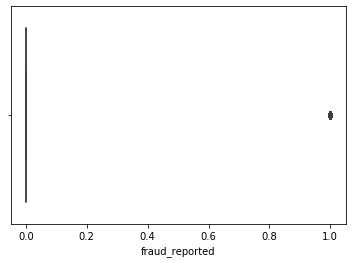

In [212]:
sns.boxplot(ds['fraud_reported'])

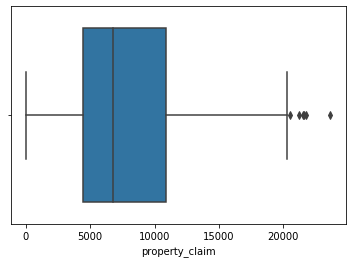

In [213]:
sns.boxplot(ds['property_claim'])

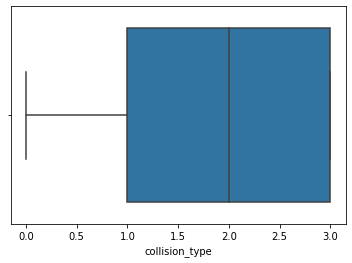

In [214]:
sns.boxplot(ds['collision_type'])

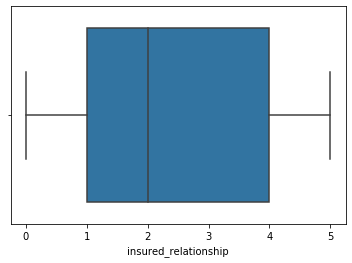

In [215]:
sns.boxplot(ds['insured_relationship'])

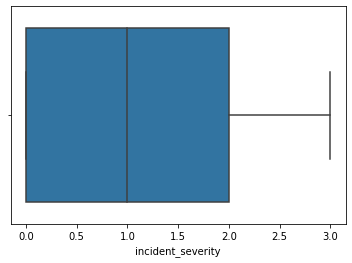

In [216]:
sns.boxplot(ds['incident_severity'])

It seems outliers are present in the dataset

# distributionplot: to check the skewness of data

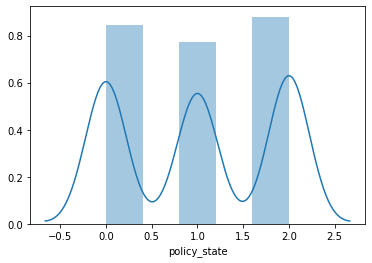

In [217]:
sns.distplot(ds['policy_state'])

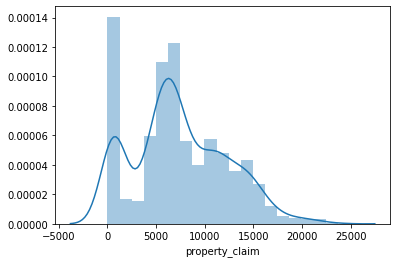

In [218]:
sns.distplot(ds['property_claim'])

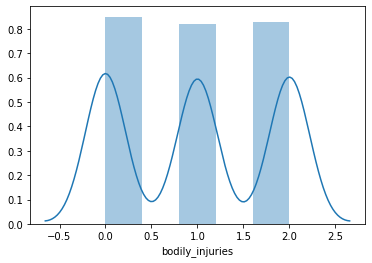

In [219]:
sns.distplot(ds['bodily_injuries'])

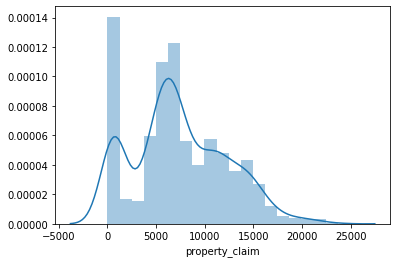

In [220]:
sns.distplot(ds['property_claim'])

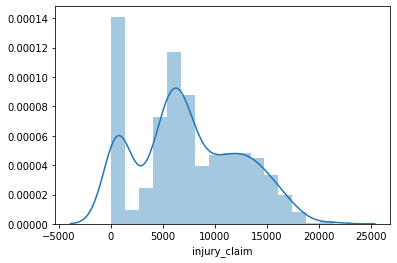

In [221]:
sns.distplot(ds['injury_claim'])

From above distribution plot, it seems, data is not normally distributed, it is skewed

# Bivariate Analysis

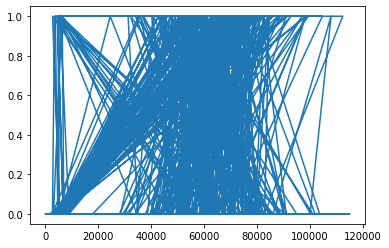

In [222]:
plt.plot(ds['total_claim_amount'], ds['fraud_reported'])
plt.show()

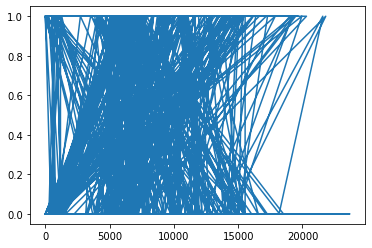

In [223]:
plt.plot(ds['property_claim'], ds['fraud_reported'])
plt.show()

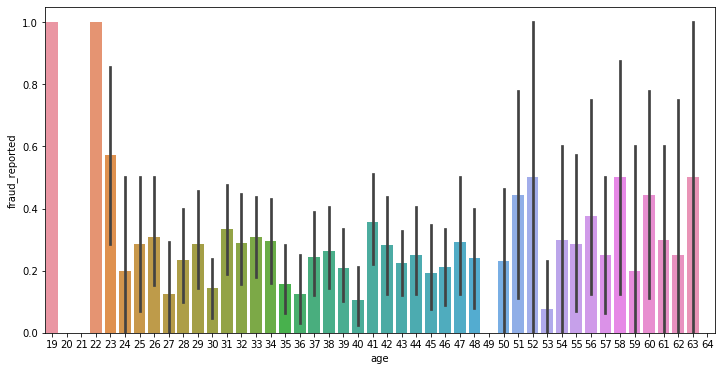

In [224]:
plt.figure(figsize=(12, 6))
sns.barplot(x='age', y='fraud_reported', data=ds)

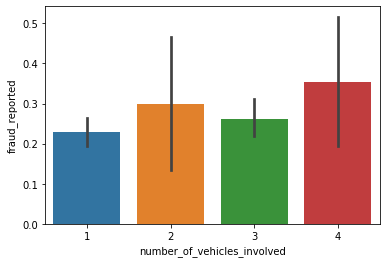

In [225]:
sns.barplot(x='number_of_vehicles_involved', y='fraud_reported', data=ds)

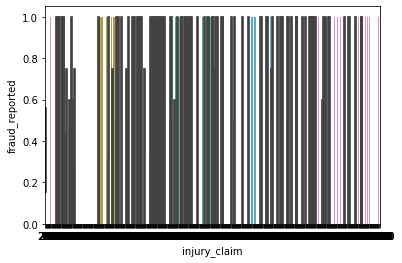

In [226]:
sns.barplot(x='injury_claim', y='fraud_reported', data=ds)

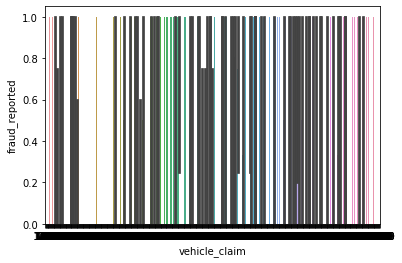

In [227]:
sns.barplot(x='vehicle_claim', y='fraud_reported', data=ds)

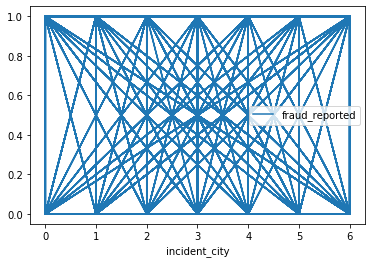

In [228]:
ds.plot(x='incident_city', y='fraud_reported', kind='line')
plt.show()

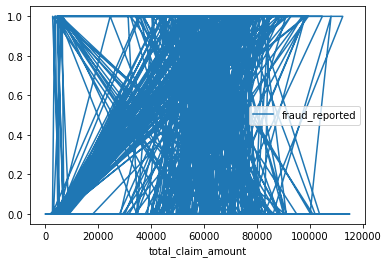

In [229]:
ds.plot(x='total_claim_amount', y='fraud_reported', kind= 'line')
plt.show()

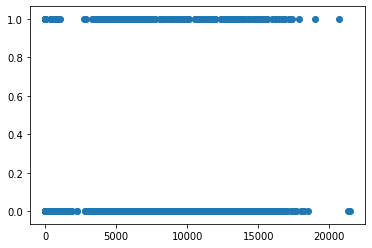

In [230]:
plt.scatter(ds['injury_claim'], ds['fraud_reported'])
plt.show()

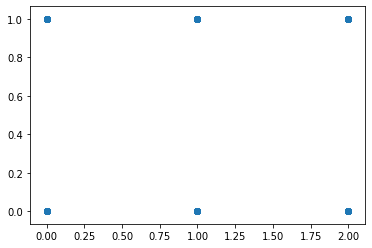

In [231]:
plt.scatter(ds['police_report_available'], ds['fraud_reported'])
plt.show()

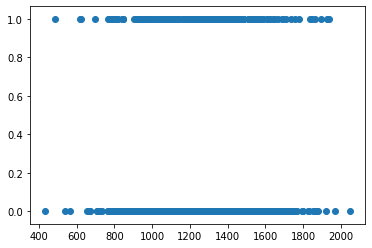

In [232]:
plt.scatter(ds['policy_annual_premium'], ds['fraud_reported'])
plt.show()

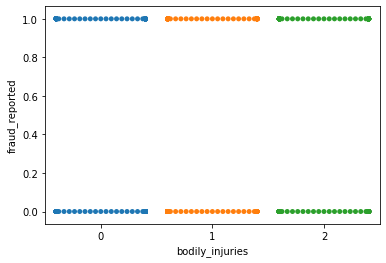

In [233]:
sns.swarmplot(x='bodily_injuries', y='fraud_reported', data=ds)

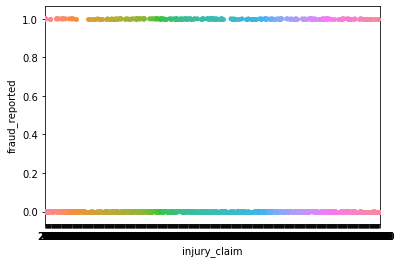

In [234]:
sns.swarmplot(x='injury_claim', y='fraud_reported', data=ds)

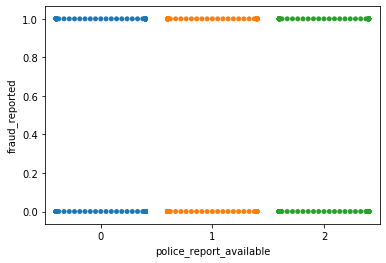

In [235]:
sns.swarmplot(x='police_report_available', y='fraud_reported', data=ds)

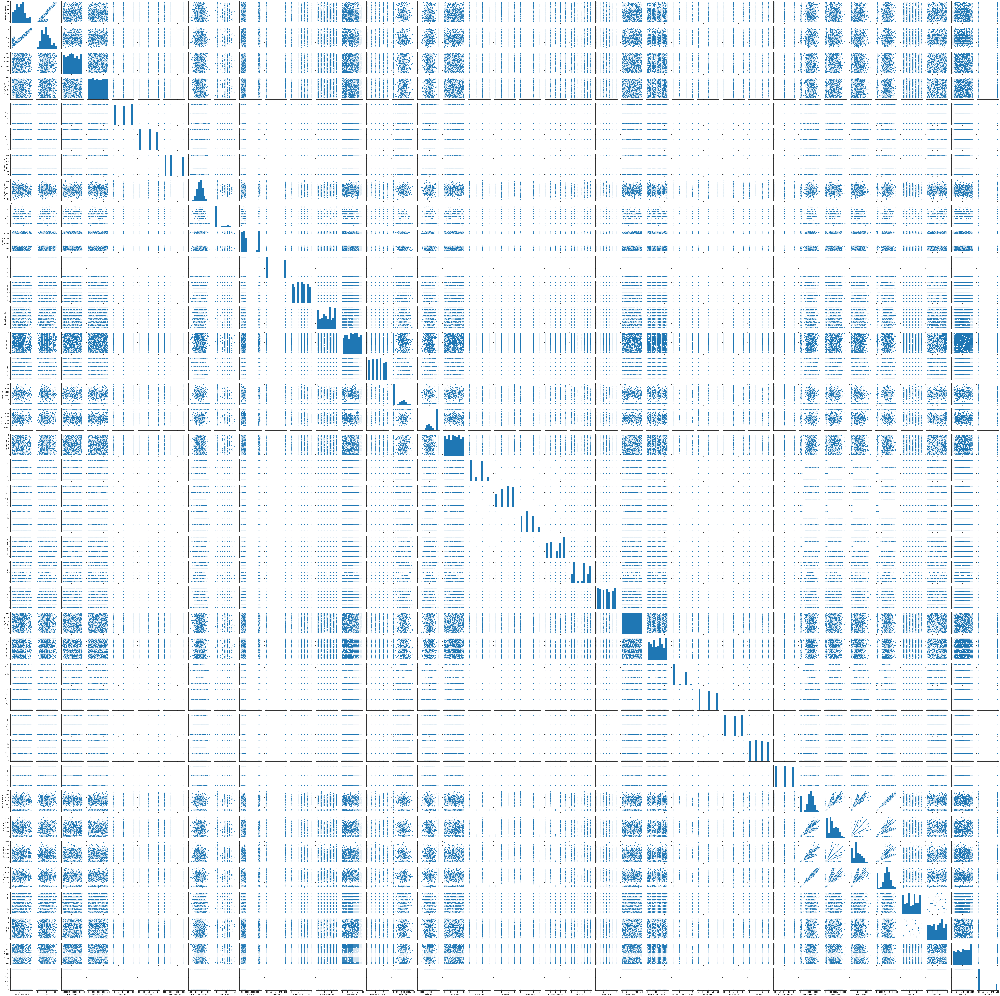

In [236]:
sns.pairplot(ds)

# Removing outliers

In [237]:
# Checking the 'z score' / outliers of the dataset, if present, will remove it
from scipy.stats import zscore
z_scr = abs(zscore(ds))
print ('Before removing zscore: ', ds.shape)

ds_final = ds.loc[(z_scr < 3).all(axis=1)]
print ("After removing zscore: ", ds_final.shape)

Before removing zscore:  (1000, 39)
After removing zscore:  (980, 39)


In [238]:
# Assigning the input and output data
df_x = ds_final.drop(columns = ['fraud_reported'])
y = ds_final['fraud_reported']

In [239]:
y.unique()

array([1, 0])

In [240]:
# StandardScaler is used to scale the data
sc = StandardScaler()
x = sc.fit_transform(df_x)
x = pd.DataFrame(x, columns=df_x.columns)

In [241]:
(x.shape, y.shape)

((980, 38), (980,))

In [242]:
x.skew()

months_as_customer             0.362608
age                            0.475385
policy_number                  0.036283
policy_bind_date               0.006386
policy_state                  -0.038157
policy_csl                     0.098248
policy_deductable              0.476090
policy_annual_premium          0.035964
umbrella_limit                 1.801424
insured_zip                    0.837283
insured_sex                    0.139324
insured_education_level        0.006286
insured_occupation            -0.055360
insured_hobbies               -0.061488
insured_relationship           0.078339
capital-gains                  0.466619
capital-loss                  -0.376884
incident_date                  0.002604
incident_type                  0.090563
collision_type                -0.194015
incident_severity              0.277726
authorities_contacted         -0.114044
incident_state                -0.149255
incident_city                  0.043882
incident_location             -0.003369


In [243]:
# Remove skewness 
for col in x.columns:
    if x.skew().loc[col] > 0.55:
        x[col] = np.sqrt(x[col])

In [244]:
x.skew()

months_as_customer             0.362608
age                            0.475385
policy_number                  0.036283
policy_bind_date               0.006386
policy_state                  -0.038157
policy_csl                     0.098248
policy_deductable              0.476090
policy_annual_premium          0.035964
umbrella_limit                -0.777682
insured_zip                   -0.064411
insured_sex                    0.139324
insured_education_level        0.006286
insured_occupation            -0.055360
insured_hobbies               -0.061488
insured_relationship           0.078339
capital-gains                  0.466619
capital-loss                  -0.376884
incident_date                  0.002604
incident_type                  0.090563
collision_type                -0.194015
incident_severity              0.277726
authorities_contacted         -0.114044
incident_state                -0.149255
incident_city                  0.043882
incident_location             -0.003369


In [245]:
x.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year
0,1.069568,0.983352,-0.095774,0.212074,1.179821,0.067231,-0.224643,0.620031,NaN,NaN,...,0.002498,0.466378,1.266345,0.718507,-0.187627,1.176015,0.753824,0.851959,-1.640447,-0.188594
1,0.202726,0.329711,-0.790245,1.259905,-0.024580,0.067231,1.412161,-0.248448,1.375052,NaN,...,-1.221626,-1.333033,-1.205803,-1.808821,-1.361005,-1.378984,-1.824679,0.355279,-0.651740,0.310476
2,-0.612105,-1.086511,0.549720,-1.042421,1.179821,-1.175916,1.412161,0.645834,1.375052,NaN,...,1.226623,1.366083,0.030271,-0.685311,0.056059,-0.738147,-0.784678,-0.638083,0.966145,0.310476
3,0.445442,0.220771,-1.237342,1.060491,-1.228980,0.067231,1.412161,0.656603,1.537041,1.227287,...,0.002498,0.466378,0.030271,0.406674,-0.222439,-0.218380,0.681623,-0.886423,1.325675,1.474975
4,0.202726,0.547591,-0.694703,-1.060550,-1.228980,1.310379,-0.224643,1.353117,1.537041,1.241984,...,-1.221626,-0.433327,0.030271,-1.754507,-1.254521,-1.406121,-1.769467,-1.631444,1.056027,0.643190


In [246]:
x.replace(np.nan, 0, inplace=True)

In [247]:
x.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year
0,1.069568,0.983352,-0.095774,0.212074,1.179821,0.067231,-0.224643,0.620031,0.000000,0.000000,...,0.002498,0.466378,1.266345,0.718507,-0.187627,1.176015,0.753824,0.851959,-1.640447,-0.188594
1,0.202726,0.329711,-0.790245,1.259905,-0.024580,0.067231,1.412161,-0.248448,1.375052,0.000000,...,-1.221626,-1.333033,-1.205803,-1.808821,-1.361005,-1.378984,-1.824679,0.355279,-0.651740,0.310476
2,-0.612105,-1.086511,0.549720,-1.042421,1.179821,-1.175916,1.412161,0.645834,1.375052,0.000000,...,1.226623,1.366083,0.030271,-0.685311,0.056059,-0.738147,-0.784678,-0.638083,0.966145,0.310476
3,0.445442,0.220771,-1.237342,1.060491,-1.228980,0.067231,1.412161,0.656603,1.537041,1.227287,...,0.002498,0.466378,0.030271,0.406674,-0.222439,-0.218380,0.681623,-0.886423,1.325675,1.474975
4,0.202726,0.547591,-0.694703,-1.060550,-1.228980,1.310379,-0.224643,1.353117,1.537041,1.241984,...,-1.221626,-0.433327,0.030271,-1.754507,-1.254521,-1.406121,-1.769467,-1.631444,1.056027,0.643190


# classification algorithm for dataset with target variable as 'fraud_reported'

In [248]:
# Subroutine to get the best random state with maximum accuracy score

def max_acu_score (regr, x, y):
    max_acu_score = 0
    for r_state in range (42, 100):

        x_train, x_test, y_train, y_test = train_test_split(x, y, random_state=r_state, test_size=.20)

        regr.fit(x_train, y_train)
        y_pred = regr.predict(x_test)
        acu_scr = accuracy_score(y_test, y_pred)


        #print ("\n accuracy score corresponding to state: ", r_state, " is: ", acu_scr)
        if (acu_scr > max_acu_score):
            max_acu_score = acu_scr
            final_r_state = r_state
    print ("\nMax accuracy score corresponding to ", final_r_state, " is: ", max_acu_score)
    return final_r_state

In [249]:
# algorithms used for classification
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB

In [250]:
KNN = KNeighborsClassifier()
SV = SVC()
DT = DecisionTreeClassifier()
RFC = RandomForestClassifier()
LR = LogisticRegression()
GNB =  GaussianNB()

In [251]:
models = []
models.append(('KNeighborsClassifier', KNN))
models.append(('SVC', SV))
models.append(('DecisionTraeeClassifier', DT))
models.append(('RandomForestClassifier', RFC))
models.append(('LogisticRegression', LR))
models.append(('GaussianNB', GNB))

****************** KNeighborsClassifier *********************



Max accuracy score corresponding to  84  is:  0.7755102040816326
KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                     weights='uniform')
Predicted values:  [1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 0]


Accuracy score:  0.7755102040816326


cross val score:  0.7173469387755103


[0.        0.0516129 1.       ] [0.         0.12195122 1.        ] [2 1 0]
roc auc score:  0.5351691581431944


classification report:                precision    recall  f1-score   supp

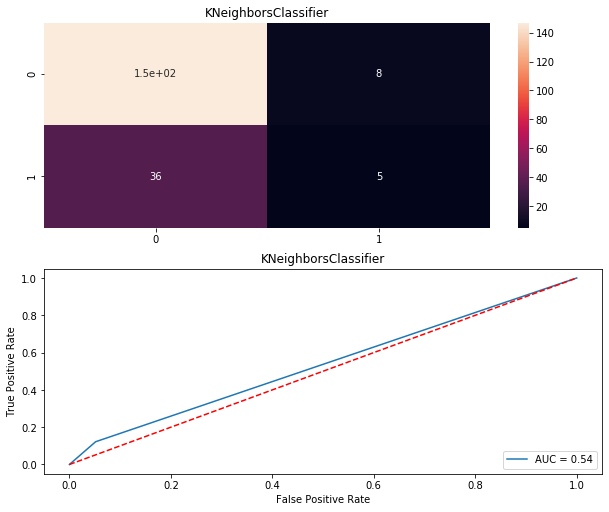

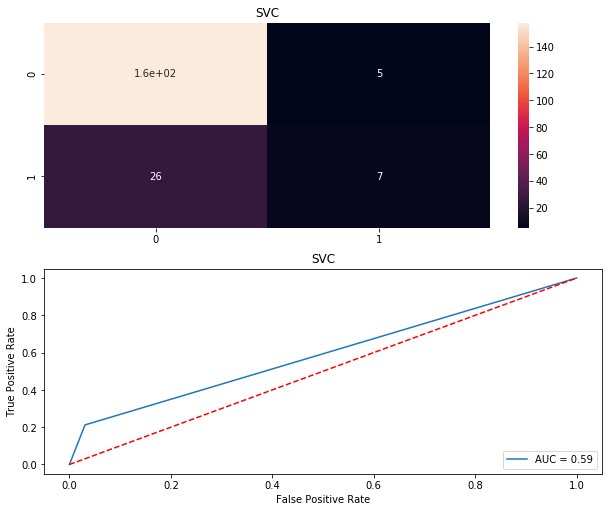

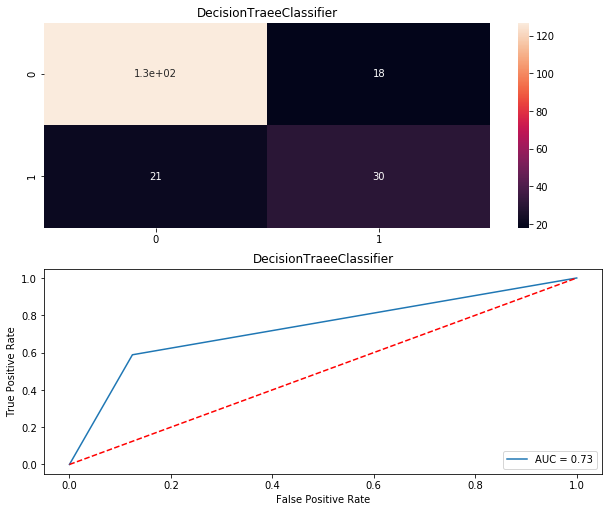

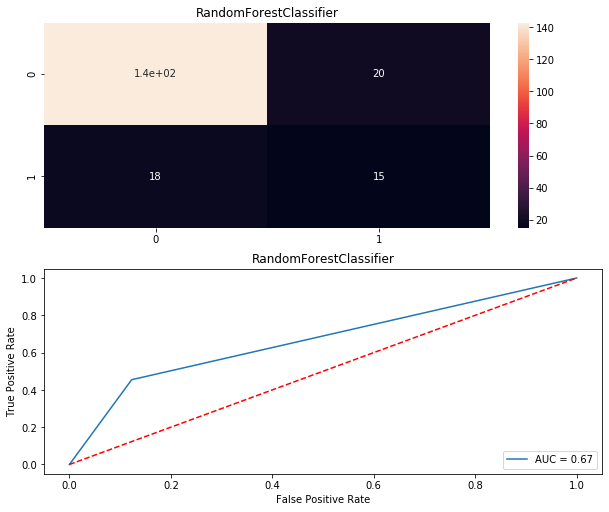

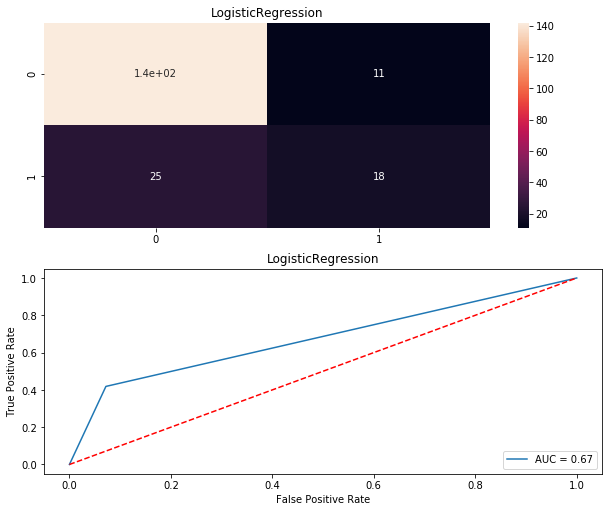

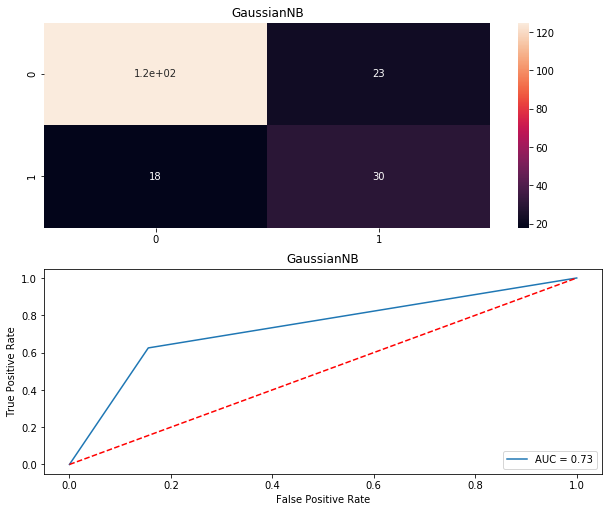

In [252]:
Model = []
score = []
cvs = []
rocscore = []
rstate = []

for name, model in models:    
    print ('******************', name , '*********************')
    print ("\n")
    
    model_state = max_acu_score(model, x, y)
    rstate.append(model_state)
    
    x_train, x_test, y_train, y_test = train_test_split(x, y, random_state = model_state, test_size = .20)
    
    Model.append(name)
    model.fit (x_train, y_train)
    print (model)
    
    pre = model.predict(x_test)
    print ("Predicted values: ", pre)
    print ('\n')
    
    AS = accuracy_score(y_test, pre)
    print ("Accuracy score: ", AS)
    score.append (AS*100)
    print ('\n')
    
    sc = cross_val_score(model, x, y, cv =10, scoring='accuracy').mean()
    print ("cross val score: ", sc)    
    cvs.append(sc*100)
    print ('\n')
    
    fpr, tpr, thresholds = roc_curve(y_test, pre, pos_label=1)
    print (fpr, tpr, thresholds)
    roc_auc = auc(fpr, tpr)
    print ("roc auc score: ", roc_auc)
    rocscore.append(roc_auc * 100)
    print ('\n')
    
    print ("classification report: ", classification_report (y_test, pre) )
    print ('\n')
    
    cm = confusion_matrix(y_test, pre)
    print (cm)
    print ('\n')
    
    plt.figure(figsize=(10,40))
    plt.subplot(911)
    plt.title(name)
    print (sns.heatmap(cm, annot=True))
     
    plt.subplot(912)
    plt.title(name)
    plt.plot(fpr, tpr, label='AUC = %0.2f'%(roc_auc))
    plt.plot ([0,1], [0,1], 'r--')
    plt.legend(loc = 'lower right')
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    print ('\n\n')

In [253]:
# Displaying the data in tabular form
result = pd.DataFrame({'Model': Model, 'Accuracy_Score': score, 'Cross Val Score' : cvs, 'ROC_AUC_Curve': rocscore, 'RandomState': rstate })
result

,Model,Accuracy_Score,Cross Val Score,ROC_AUC_Curve,RandomState
0,KNeighborsClassifier,77.551020,71.734694,53.516916,84
1,SVC,84.183673,75.102041,59.072318,68
2,DecisionTraeeClassifier,80.102041,76.938776,73.204868,98
3,RandomForestClassifier,80.612245,75.714286,66.592303,68
4,LogisticRegression,81.632653,77.448980,67.335461,48
5,GaussianNB,79.081633,72.142857,73.479730,75


In [254]:
#Using the best model for gridsearchcv

parameters = { 'C' : [0.001, 0.01, 0.0001, 1, 10], 'kernel' : ['poly', 'rbf', 'linear'], 'gamma': [1,0.1, 0.01]}

gsc = GridSearchCV(estimator = SV, param_grid = parameters, cv=10)

In [255]:
gsc.fit(x,y)

GridSearchCV(cv=10, error_score=nan,
             estimator=SVC(C=1.0, break_ties=False, cache_size=200,
                           class_weight=None, coef0=0.0,
                           decision_function_shape='ovr', degree=3,
                           gamma='scale', kernel='rbf', max_iter=-1,
                           probability=False, random_state=None, shrinking=True,
                           tol=0.001, verbose=False),
             iid='deprecated', n_jobs=None,
             param_grid={'C': [0.001, 0.01, 0.0001, 1, 10],
                         'gamma': [1, 0.1, 0.01],
                         'kernel': ['poly', 'rbf', 'linear']},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [256]:
gsc.best_params_

{'C': 10, 'gamma': 1, 'kernel': 'linear'}

In [257]:
x_train, x_test, y_train, y_test = train_test_split(x, y, random_state=68, test_size = 0.20)
svc = SVC(C= 10, gamma= 1, kernel= 'linear' )
svc.fit(x_train, y_train)
y_pred =  svc.predict(x_test)
print (y_pred)

[0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 1 1 1 0 0 0 0 0 1 1 1 0 0 1
 0 0 0 1 0 0 1 0 1 0 0 0 1 0 0 0 1 0 0 0 0 0 1 1 0 0 1 0 0 0 1 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 1 0 0 1 1 0 0 0 0 0 1 1 0 0 1 1 0 0 0 0 1 0 0 1 1 1 0 0
 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 1 1 1 0 0 0 0 0 0 0 1 0 1 0 1 0
 0 0 0 0 0 0 0 1 0 1 1 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 1
 0 0 0 0 1 0 0 0 0 0 0]


We need to predict the fraud in the automobile insuarance.

In [258]:
# Saving the predicted values in csv files
dft = pd.DataFrame(y_pred)
dft.to_csv ('pred_automobile_fraud.csv')

accuracy score:  0.8112244897959183
Classification Report : 
               precision    recall  f1-score   support

           0       0.94      0.83      0.88       163
           1       0.46      0.73      0.56        33

    accuracy                           0.81       196
   macro avg       0.70      0.78      0.72       196
weighted avg       0.86      0.81      0.83       196

Confusion_matrix:  [[135  28]
 [  9  24]]
cross val score:  0.7714285714285714
roc auc score:  0.7777467930842163
AxesSubplot(0.125,0.808774;0.62x0.0712264)





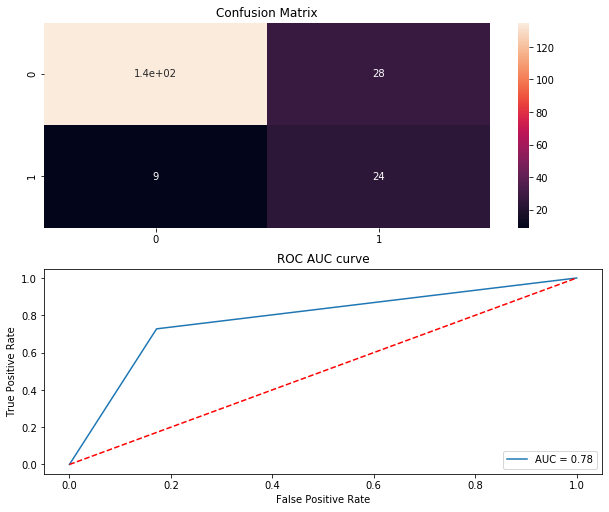

In [259]:
print ("accuracy score: ", accuracy_score(y_test, y_pred))
print ("Classification Report : \n", classification_report (y_test, y_pred))
print ("Confusion_matrix: ", confusion_matrix(y_test, y_pred))
cm = confusion_matrix(y_test, y_pred)

sc = cross_val_score(svc, x, y, cv =10, scoring='accuracy').mean()
print ("cross val score: ", sc)    

fpr, tpr, thresholds = roc_curve(y_test, y_pred, pos_label=1)
roc_auc = auc(fpr, tpr)
print ("roc auc score: ", roc_auc)
   
plt.figure(figsize=(10,40))
plt.subplot(911)
plt.title("Confusion Matrix")
print (sns.heatmap(cm, annot=True))
     
plt.subplot(912)
plt.title("ROC AUC curve")
plt.plot(fpr, tpr, label='AUC = %0.2f'%(roc_auc))
plt.plot ([0,1], [0,1], 'r--')
plt.legend(loc = 'lower right')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
print ('\n\n')

In [ ]:
# saving the model 

from sklearn.externals import joblib
joblib.dump(svc, 'project_automobile_fraud.pkl')
#clf = joblib.load('project_automobile_fraud.pkl')
#clf.predict(x_test)